<p style="font-size: 40px; font-weight: bold; text-align: center;">
  Galaxies Clustering Project 
</p>

### Dataset
**Data source:** [Galaxy Zoo 2 | Kaggle](https://www.kaggle.com/datasets/jaimetrickz/galaxy-zoo-2-images)
- dataset contains 243k images of galaxies


### Business goal
Automatic Classification of Galaxies
- Automate the process of classifying galaxies 
- Reduce the time and effort required to classify galaxies



#### Importing the libraries

In [1]:
import cv2 as cv
from PIL import Image

import os
import sys

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

sys.path.insert(0, os.path.abspath(os.path.join("..", "src")))
from utils import find_extensions, read_filenames, show_galaxies

In [2]:
#path = '/Users/michal/Documents/studia/sem4/WdUM/Galaxies_Clusterization/data/images'
path = '/Users/julia/Desktop/semestr-4/ml/projekty/projekt-2/galaxies_data/images_gz2/images'
os.chdir(path)

In [3]:
extensions = find_extensions(path)
print(extensions.keys())

dict_keys(['.jpg', '', '.txt', '.h5'])


In [4]:
print(extensions['.txt'], extensions[''])

['results', 'results_public'] ['z']


In [5]:
!wc -l results.txt
!wc -l results_public.txt

   59979 results.txt
   19992 results_public.txt


In [6]:
galaxies = read_filenames(path)

In [7]:
print(galaxies[:10])

['9733.jpg', '110369.jpg', '14147.jpg', '86425.jpg', '52112.jpg', '108526.jpg', '222363.jpg', '139923.jpg', '89716.jpg', '63.jpg']


In [8]:
heights = set()
widths = set()

for galaxy in galaxies:
    with Image.open(galaxy) as img:
        width, height = img.size
        heights.add(height)
        widths.add(width)

print(f'Heights: {heights}')
print(f'Widths: {widths}')

Heights: {424}
Widths: {424}


All images have the same size: 424 x 424

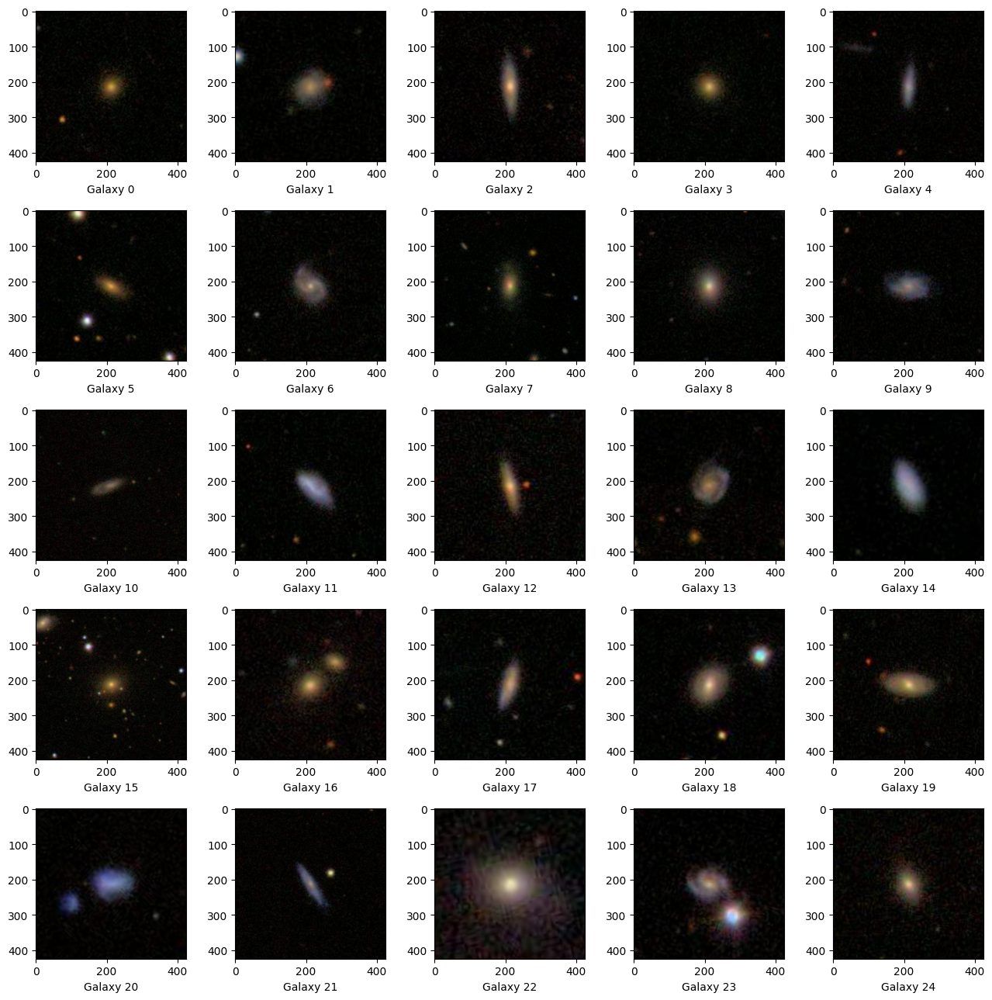

In [9]:
show_galaxies(galaxies) # Set rand = True to explore random galaxies

Galaxies are located in the center of the image, so we will cut them.
(Later another, more clever approach to cutting will be taken - see processing notebook)

In [10]:
def show_galaxy(ind, cut = True):
    if isinstance(ind, int):
        ind = galaxies[ind]
    elif not isinstance(ind, str):
        raise TypeError()    

    img = plt.imread(ind)
    if cut:
        img = img[110:310,110:310]
    plt.xlabel(f'Galaxy {ind}')
    plt.imshow(img)

Before cutting

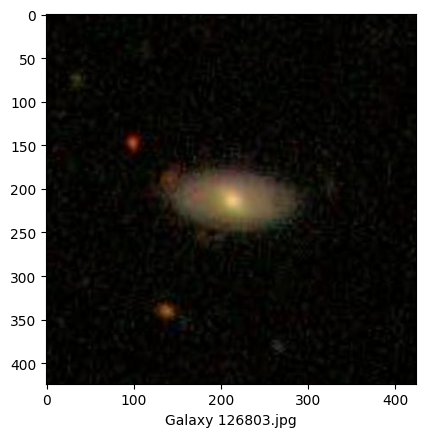

In [11]:
show_galaxy(19, False)

After cutting

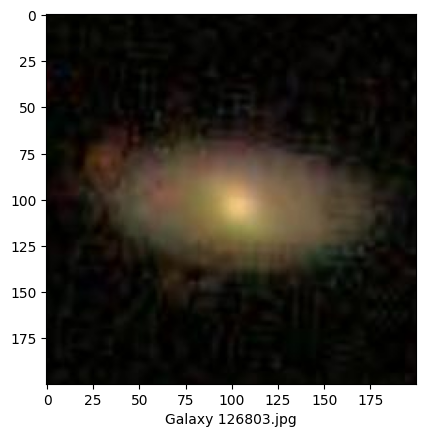

In [12]:
show_galaxy(19)

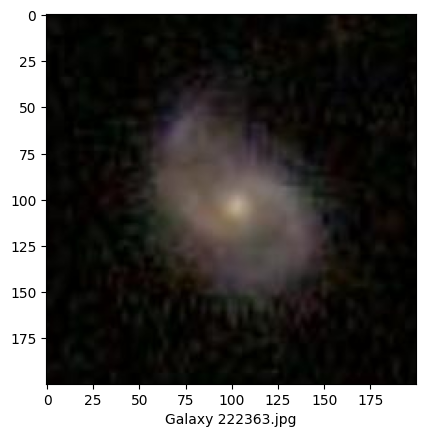

In [13]:
show_galaxy(6)

### Potential outliers

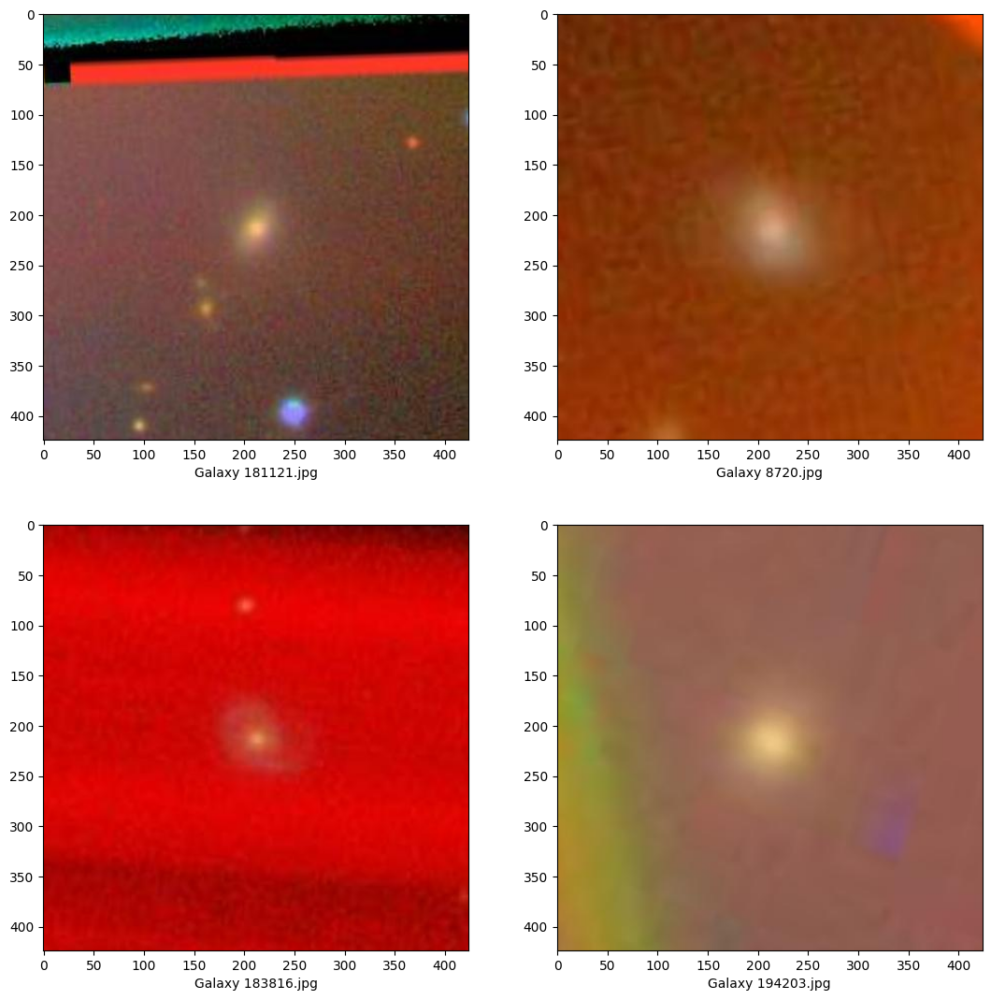

In [14]:
outliers = ['181121.jpg', '8720.jpg', '183816.jpg', '194203.jpg']

figure, axes = plt.subplots(nrows=2,ncols=2,figsize=(13,13))
for i, ax in enumerate(axes.flat):
    img = plt.imread(outliers[i])
    ax.imshow(img)
    ax.set_xlabel(f'Galaxy {outliers[i]}')

## Brightness and color analysis

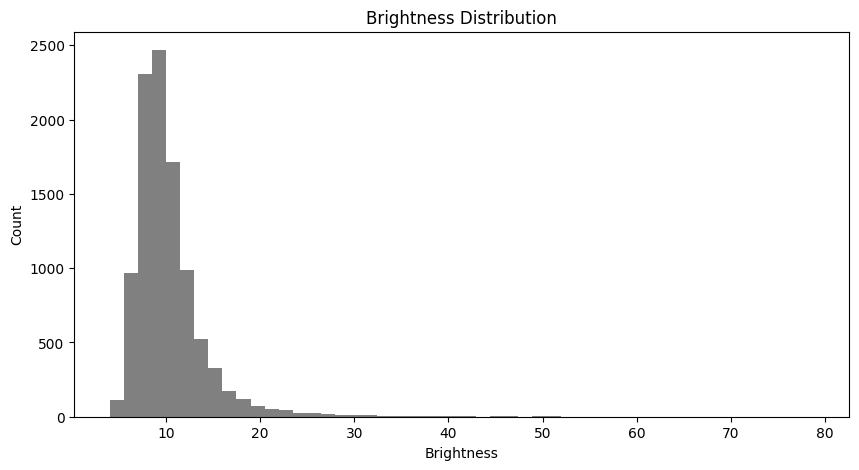

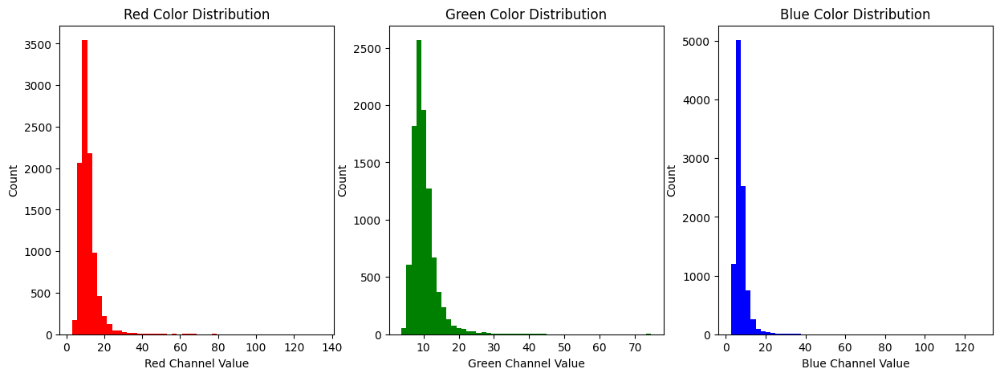

In [32]:
# Function to read images from the directory using the list of file names
def load_galaxies(file_names, max_images=10000):
    images = []
    for i, file_name in enumerate(file_names):
        if i < max_images:
            image = cv.imread(file_name)
            if image is not None:
                images.append((file_name, image))  # Store filename with the image
    return images

# Function to calculate brightness of an image
def calculate_brightness(image):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    return np.mean(gray_image)

# Function to extract color features
def extract_color_features(image):
    mean_color = cv.mean(image)[:3]  # Mean color in BGR format
    return mean_color

images = load_galaxies(galaxies)
brightness_values = [calculate_brightness(galaxy_image[1]) for galaxy_image in images]
color_features = np.array([extract_color_features(galaxy_image[1]) for galaxy_image in images])

# Plot brightness distribution
plt.figure(figsize=(10, 5))
plt.hist(brightness_values, bins=50, color='gray')
plt.title('Brightness Distribution')
plt.xlabel('Brightness')
plt.ylabel('Count')
plt.show()

# Plot color distributions
plt.figure(figsize=(15, 5))

# Red channel
plt.subplot(1, 3, 1)
plt.hist(color_features[:, 2], bins=50, color='red')
plt.title('Red Color Distribution')
plt.xlabel('Red Channel Value')
plt.ylabel('Count')

# Green channel
plt.subplot(1, 3, 2)
plt.hist(color_features[:, 1], bins=50, color='green')
plt.title('Green Color Distribution')
plt.xlabel('Green Channel Value')
plt.ylabel('Count')

# Blue channel
plt.subplot(1, 3, 3)
plt.hist(color_features[:, 0], bins=50, color='blue')
plt.title('Blue Color Distribution')
plt.xlabel('Blue Channel Value')
plt.ylabel('Count')

plt.show()

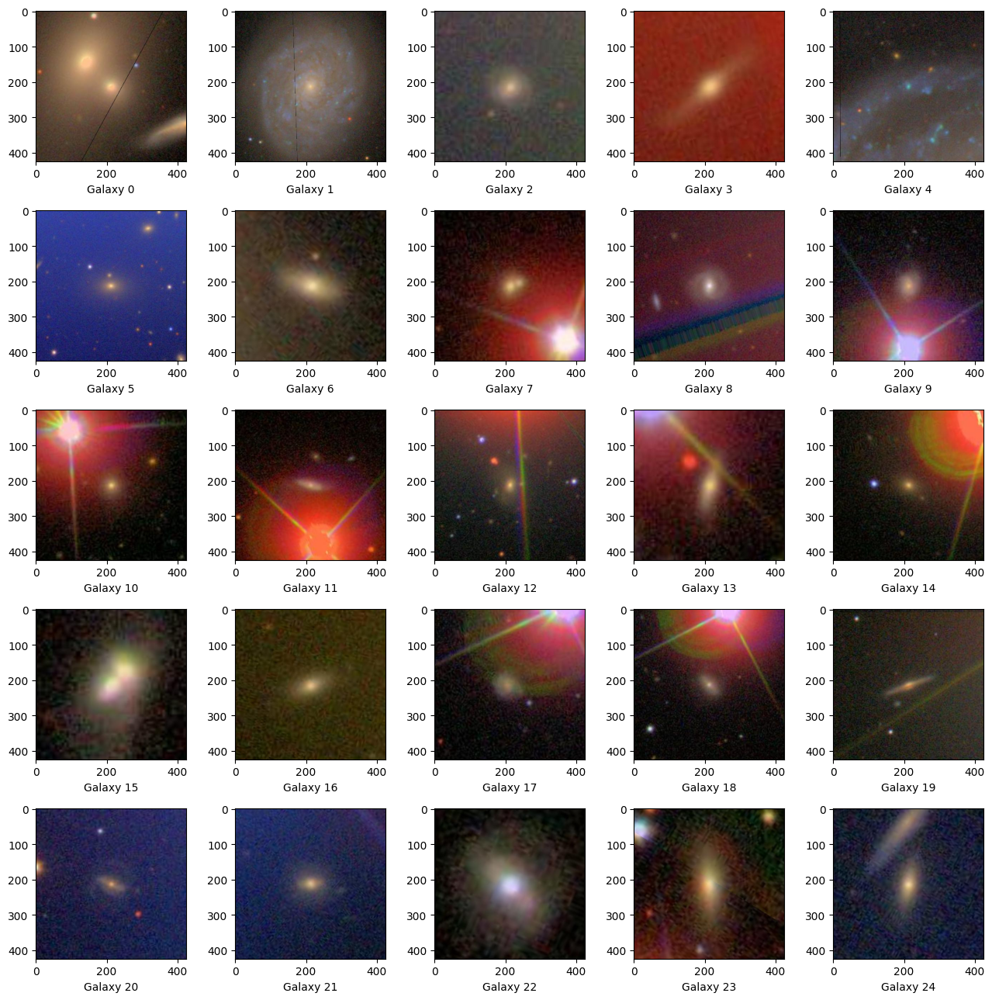

In [16]:
# find images with the highest brightness
brightest_images = np.argsort(brightness_values)[::-1]
show_galaxies([galaxies[i] for i in brightest_images[:25]])

In [62]:
def show_galaxies_2(galaxies, ncols=5, rand=False):
    num_images = len(galaxies)
    nrows = (num_images + ncols - 1) // ncols  # Calculate the number of rows needed
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 5))
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i in range(len(axes)):
        if i < num_images:
            indx = i
            img = plt.imread(galaxies[indx])
            axes[i].imshow(img)
            axes[i].axis('off')
            plt.title(f'Galaxy {galaxies[indx]}')
        else:
            axes[i].axis('off')  # Hide any extra subplots
    
    plt.tight_layout()
    plt.show()

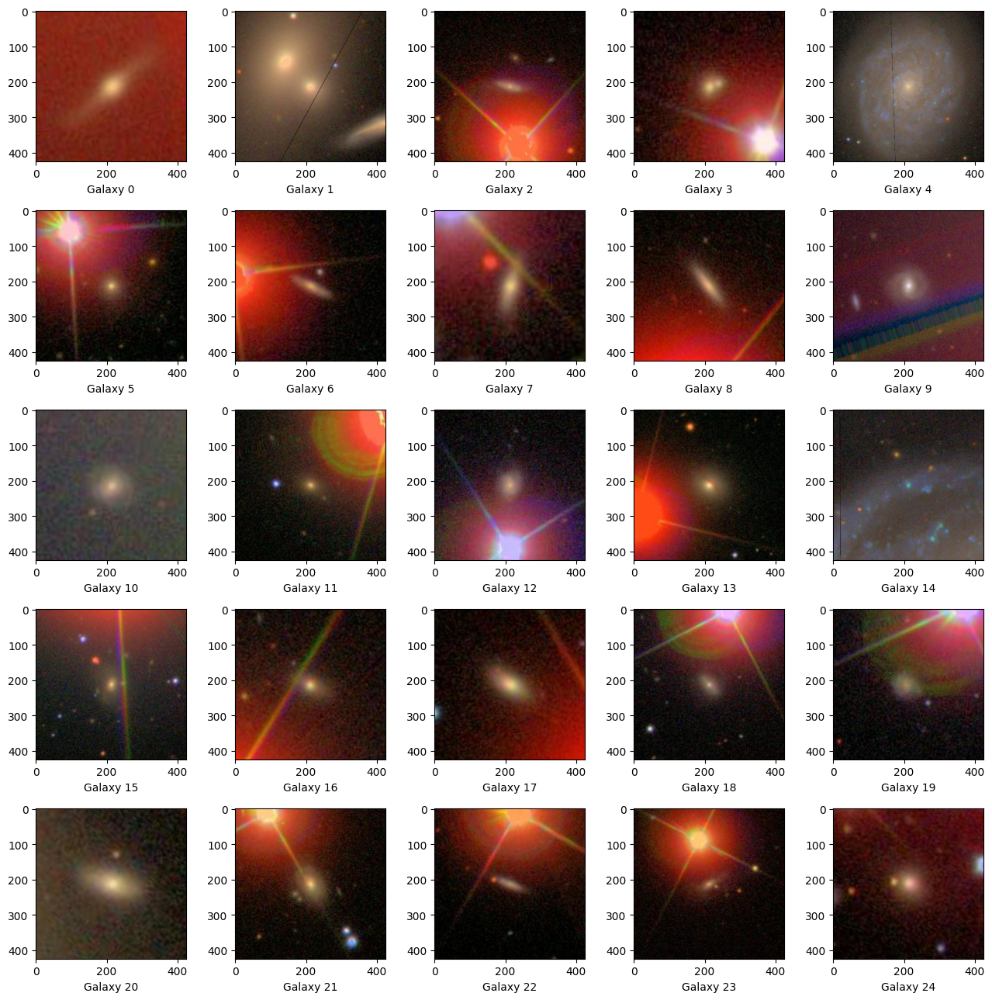

In [18]:
# find images with the highest red color
reddest_images = np.argsort(color_features[:, 2])[::-1]
show_galaxies([galaxies[i] for i in reddest_images[:25]])

Since in clustering we will not use the color information, we will see if there is a need to do something with these outliers.

In [19]:
red_intensities = color_features[:, 2]  
most_red_indices = np.argsort(red_intensities)[::-1]  # Sort in descending order of red intensity


# calculate mean and standard deviation of red channel
red_mean = np.mean(color_features[:, 2])
red_std = np.std(color_features[:, 2])

# remove outliers Q1 - 1.5 * IQR and Q3 + 1.5 * IQR
Q1 = np.percentile(color_features[:, 2], 25)
Q3 = np.percentile(color_features[:, 2], 75)
IQR = Q3 - Q1

red_channel = color_features[:, 2]
outliers = (red_channel > Q3 + 1.5 * IQR)

In [20]:
outliers_img = [images[i] for i in range(len(images)) if outliers[i]]

In [21]:
def extract_red_intensity(image):
    red_channel = image[:, :, 2]  # Red channel is the third channel in BGR
    return np.mean(red_channel)

# Sort outliers based on the red channel intensity
sorted_outliers = sorted(outliers_img, key=lambda x: extract_red_intensity(x[1]), reverse=True)

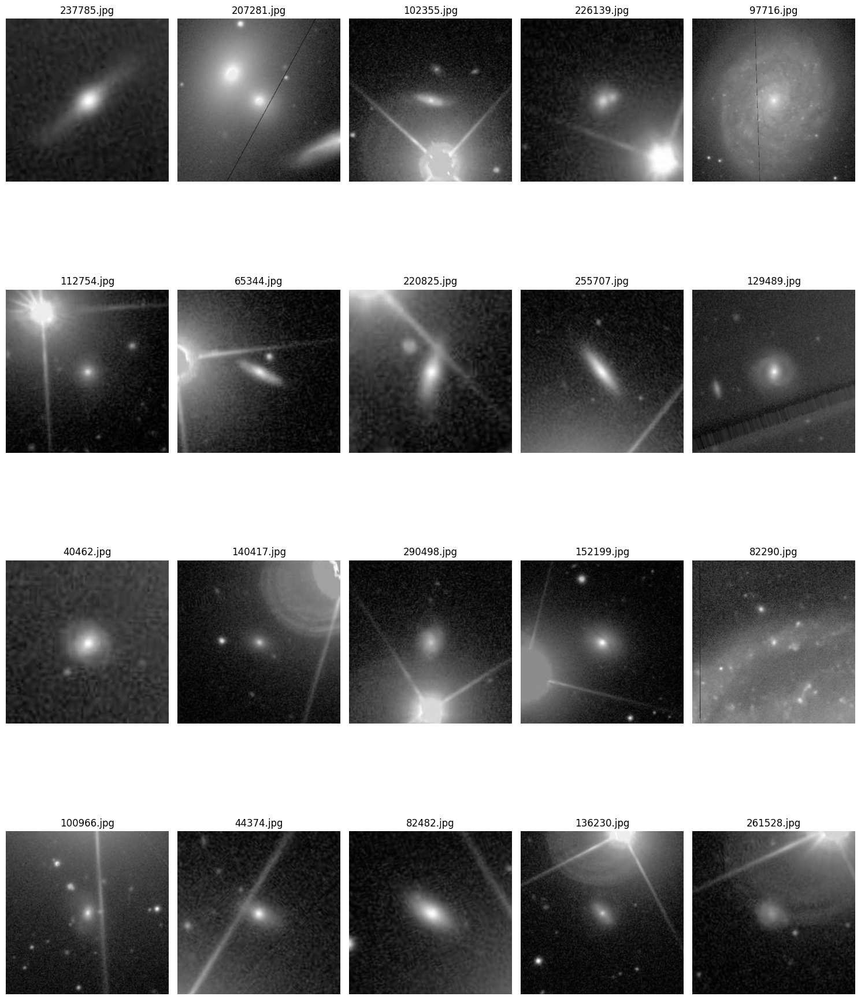

In [22]:
def apply_grayscale_filter_and_display(outliers, images_per_row=5):
    num_images = len(outliers)
    num_rows = (num_images + images_per_row - 1) // images_per_row 
    
    plt.figure(figsize=(15, num_rows * 5))
    
    for idx, (filename, image) in enumerate(outliers):
        # Convert the image to grayscale
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        # Display the grayscale image in a subplot
        plt.subplot(num_rows, images_per_row, idx + 1)
        plt.imshow(gray_image, cmap='gray')
        plt.title(f"{filename}")
        plt.axis('off')  # Hide the axis
    
    plt.tight_layout()
    plt.show()

# Apply grayscale filter to outliers and display them
apply_grayscale_filter_and_display(sorted_outliers[:20])

After converting to grayscale pictures look ok - no need to do anything with them.

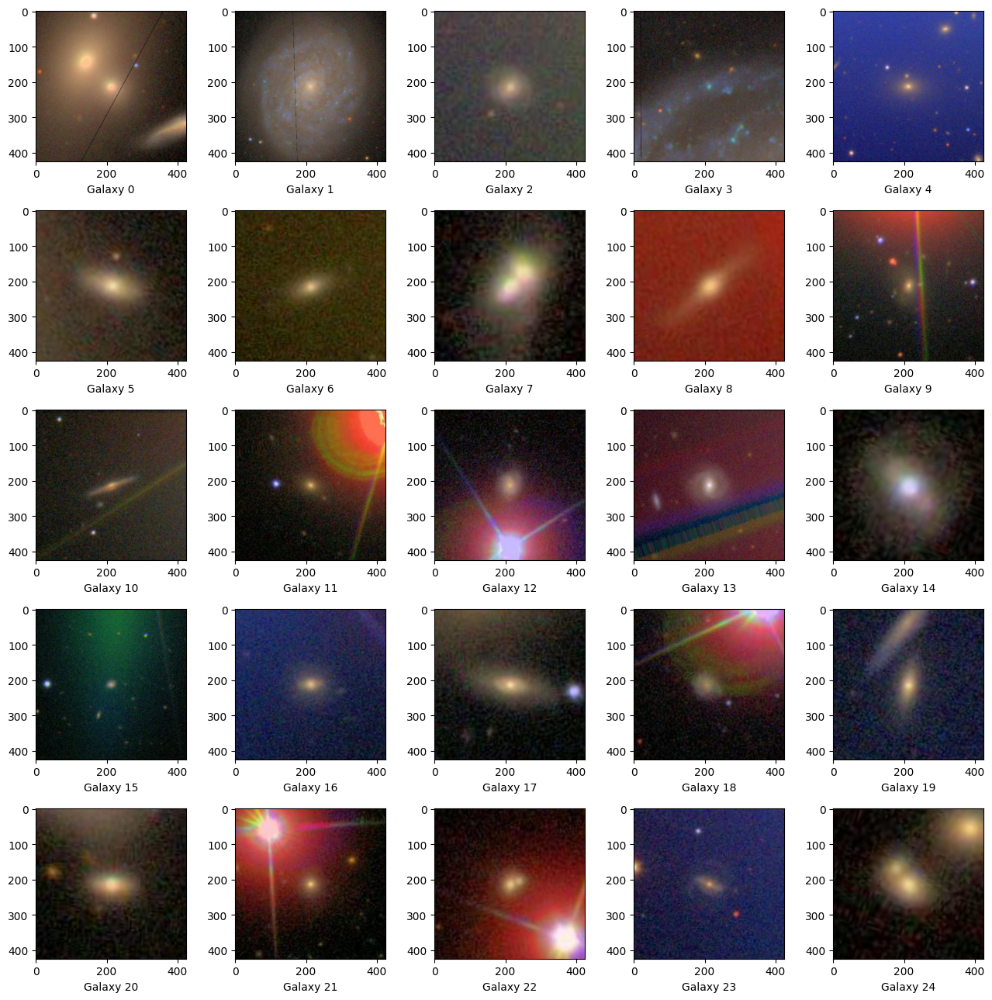

In [23]:
greenest_images = np.argsort(color_features[:, 1])[::-1]
show_galaxies([galaxies[i] for i in greenest_images[:25]])

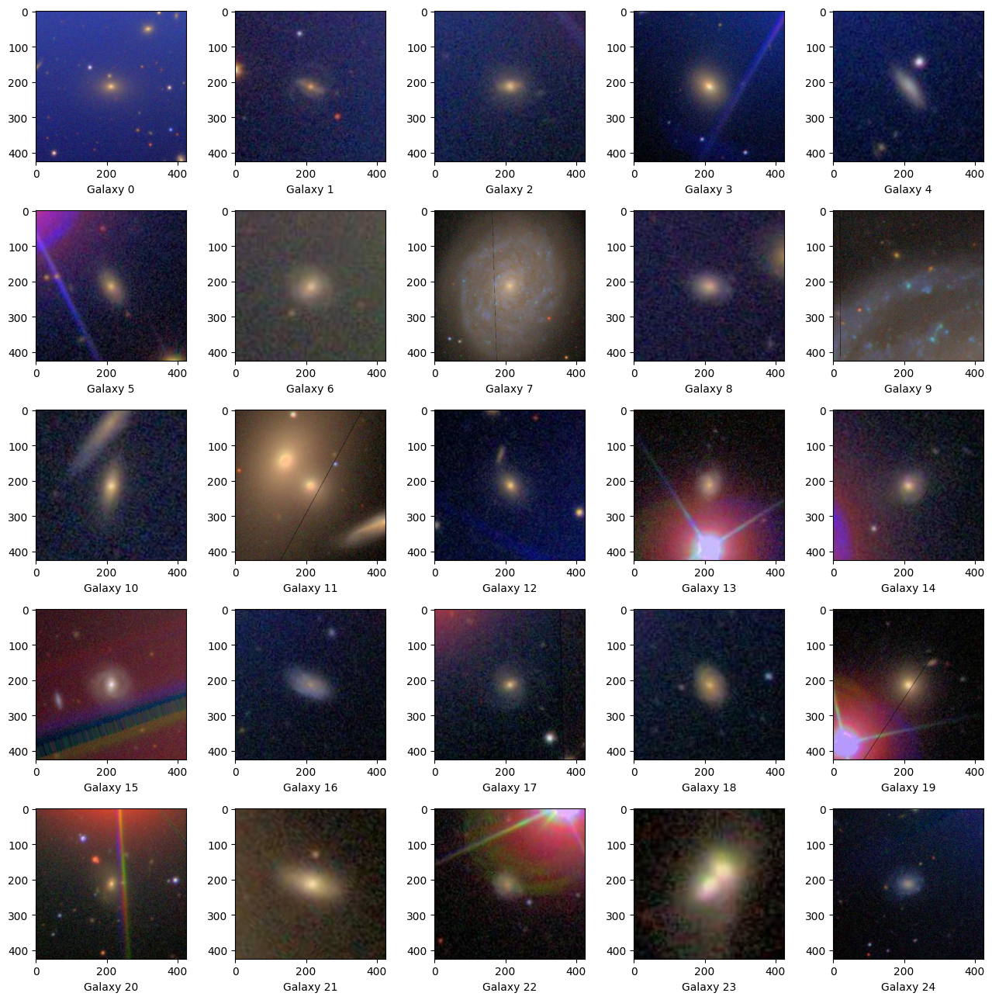

In [24]:
bluest_images = np.argsort(color_features[:, 0])[::-1]
show_galaxies([galaxies[i] for i in bluest_images[:25]])

The greenest and bluest galaxies look normal.

### Size of galaxies

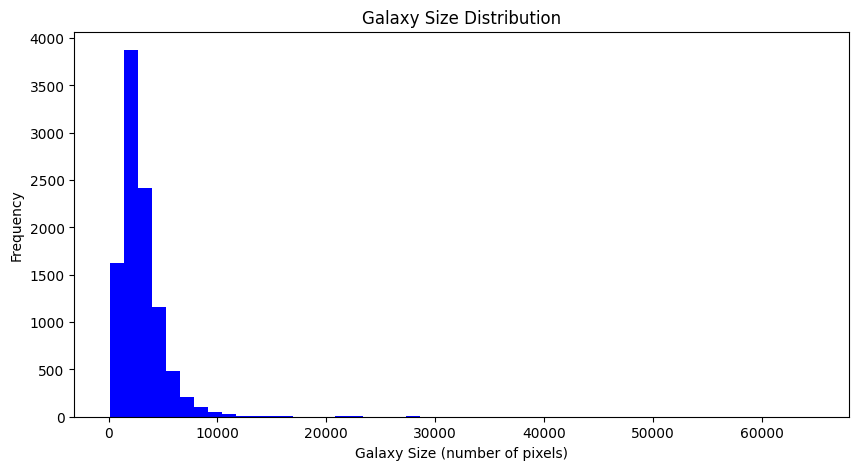

In [35]:
def calculate_galaxy_size(image, threshold=90):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    _, binary_image = cv.threshold(gray_image, threshold, 255, cv.THRESH_BINARY)
    galaxy_size = cv.countNonZero(binary_image)
    return galaxy_size

galaxy_sizes = [calculate_galaxy_size(galaxy_image[1]) for galaxy_image in images]

# Plot galaxy size distribution
plt.figure(figsize=(10, 5))
plt.hist(galaxy_sizes, bins=50, color='blue')
plt.title('Galaxy Size Distribution')
plt.xlabel('Galaxy Size (number of pixels)')
plt.ylabel('Frequency')
plt.show()


## Thresholding and contour detection

We will see if we can use thresholding or contour detection to separate the galaxies from the background.

### Binary thresholding

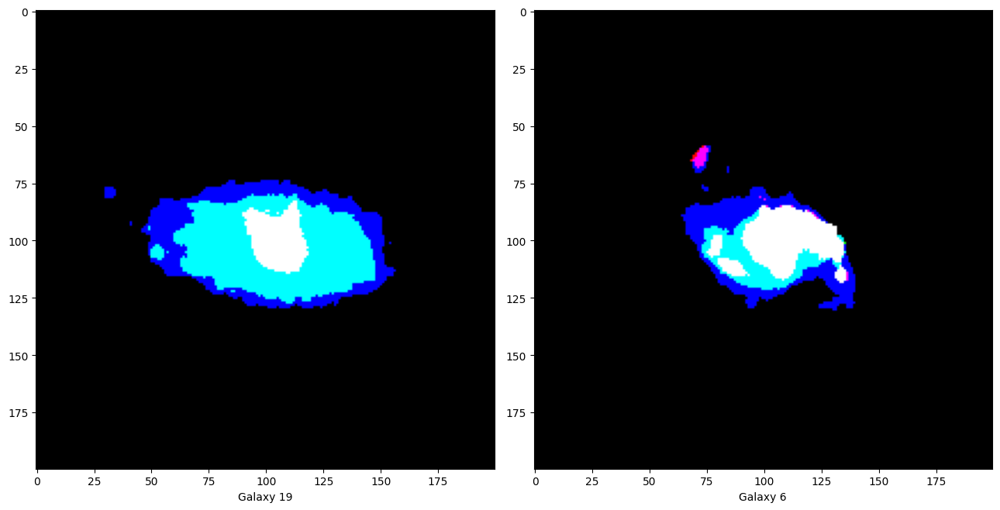

In [25]:
figure, axis = plt.subplots(nrows=1, ncols=2, figsize=(13,13))
indices = (19, 6)

for i, ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    _, Thresh_IMG = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    ax.imshow(Thresh_IMG, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')

plt.tight_layout()
plt.show()

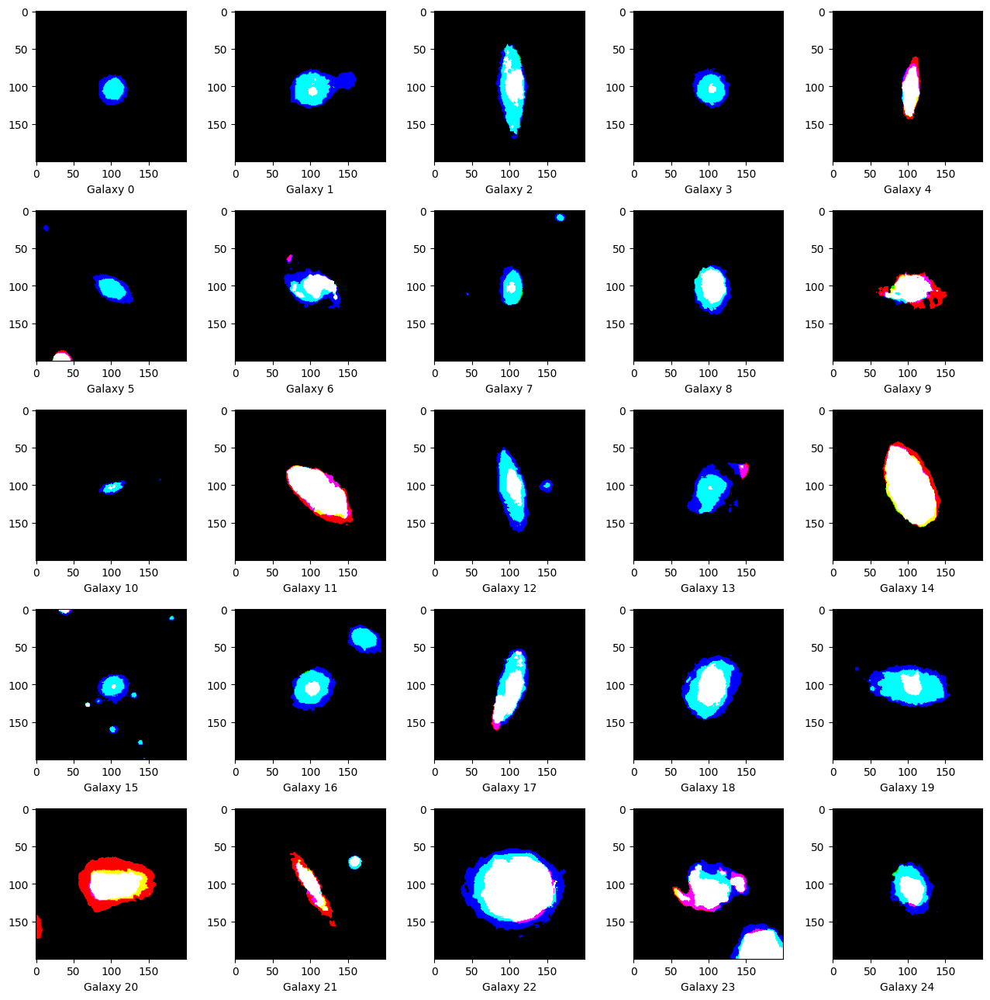

In [26]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    _,Thresh_IMG = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    ax.imshow(Thresh_IMG, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
plt.tight_layout()
plt.show()

### Contour detection

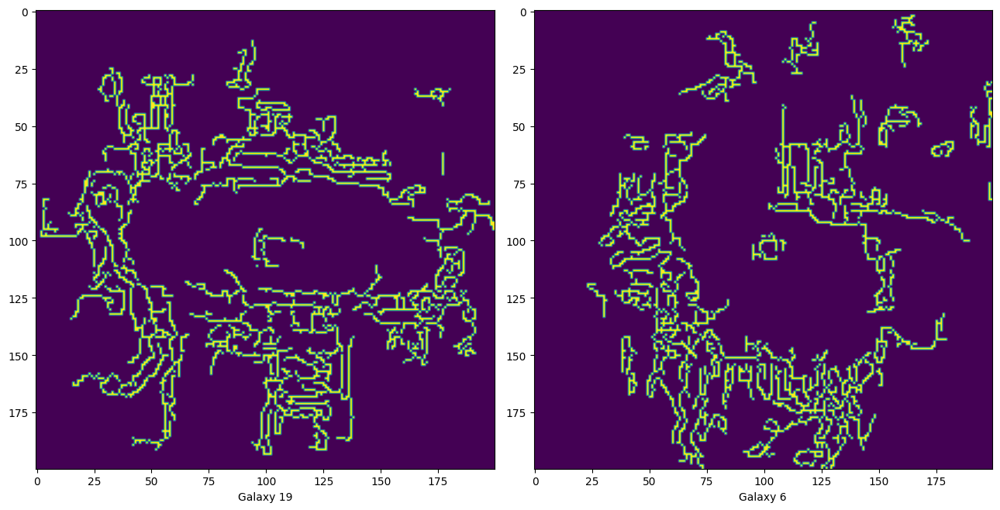

In [36]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i], 0)
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    draw_contour = cv.drawContours(canny_img, contour, -1, (255,0,0), 1)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(draw_contour)
plt.tight_layout()
plt.show()

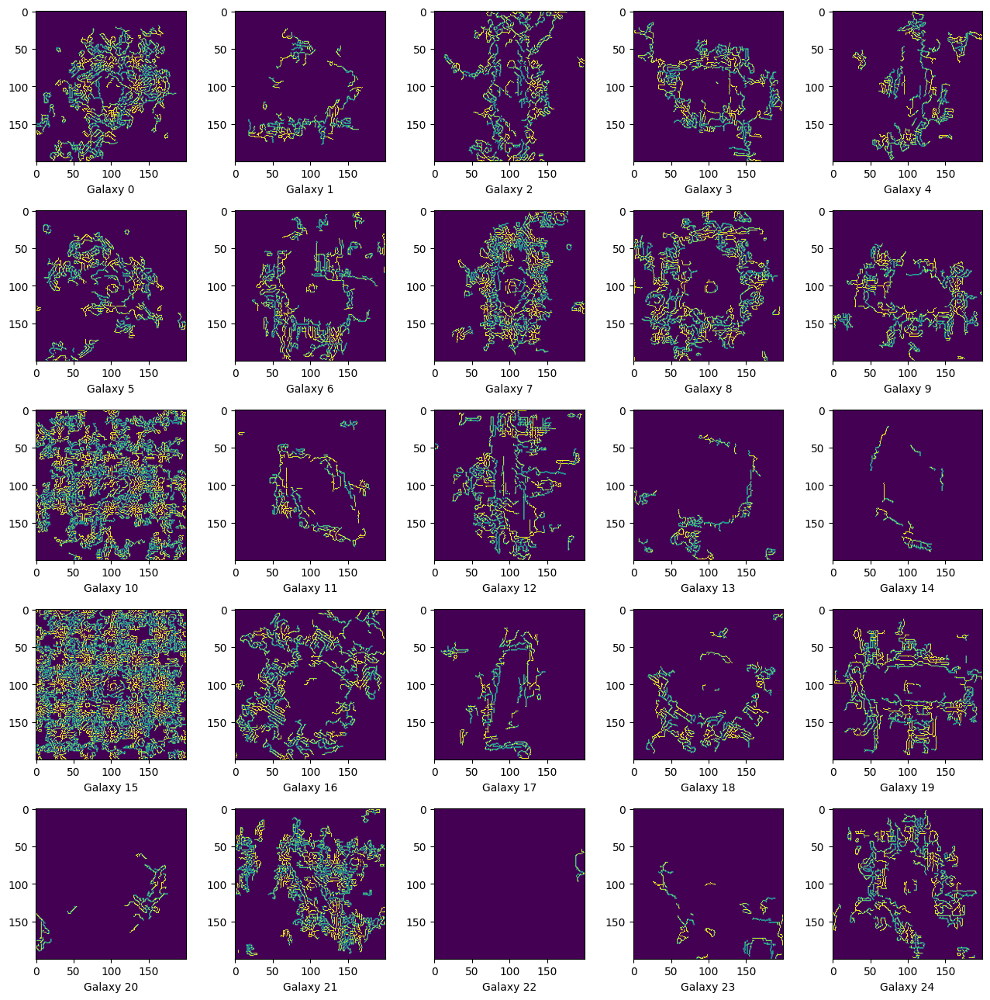

In [37]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i], 0)
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    draw_contour = cv.drawContours(canny_img, contour, -1, (255,0,0), 1)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(draw_contour)
plt.tight_layout()
plt.show()

### Absolute difference

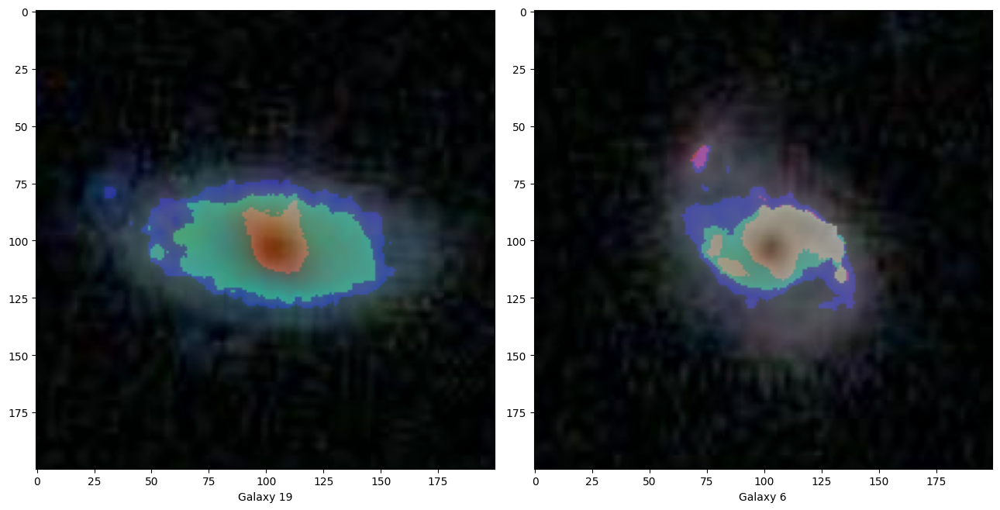

In [38]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    _, thresh_img = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    diff_img = cv.absdiff(cut_img, thresh_img)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(diff_img)
plt.tight_layout()
plt.show()

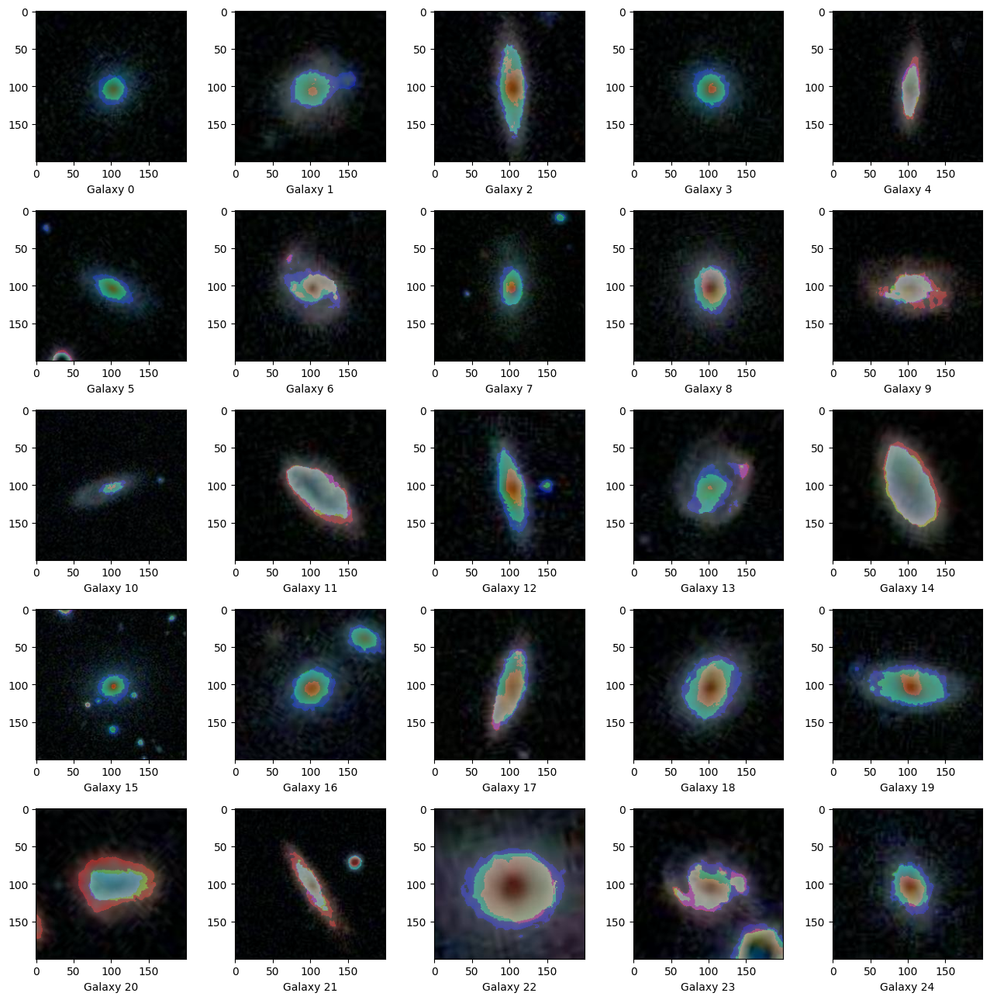

In [39]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    _, thresh_img = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    diff_img = cv.absdiff(cut_img, thresh_img)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(diff_img)
plt.tight_layout()
plt.show()

### Contour detection (bounding rectangle)

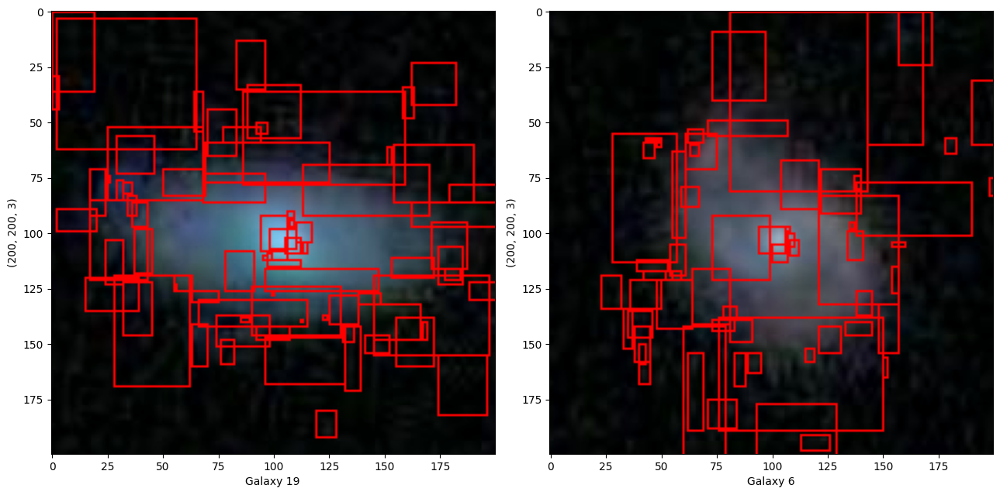

In [40]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    for cnt in contour:
        x,y,w,h = cv.boundingRect(cnt)
        cv.rectangle(cut_img,(x,y),(x+w,y+h),(255,0,0),1)
    ax.imshow(cut_img, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
    ax.set_ylabel(cut_img.shape)
plt.tight_layout()
plt.show()

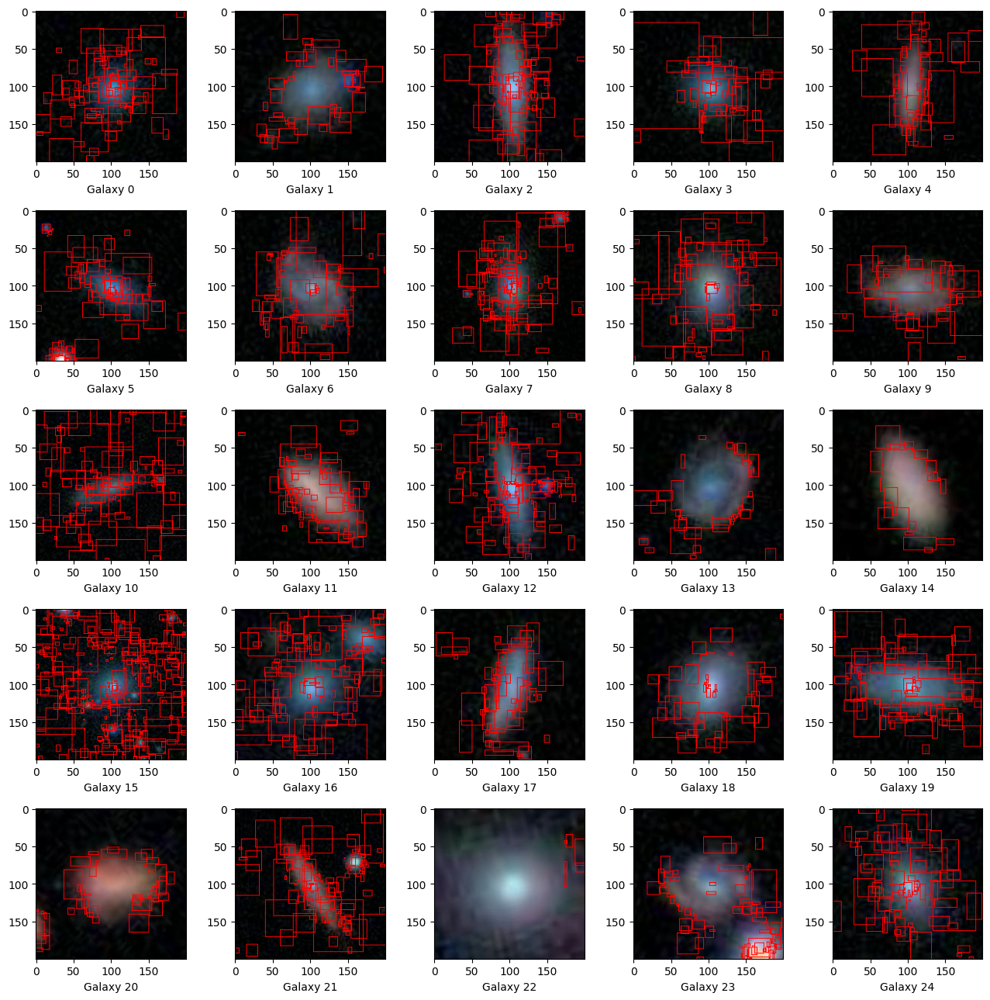

In [41]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    for cnt in contour:
        x,y,w,h = cv.boundingRect(cnt)
        cv.rectangle(cut_img,(x,y),(x+w,y+h),(255,0,0),1)
    ax.imshow(cut_img, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
plt.tight_layout()
plt.show()